# Classification in ML

# Classification Terminologies In Machine Learning
Classifier – It is an algorithm that is used to map the input data to a specific category.

Classification Model – The model predicts or draws a conclusion to the input data given for training, it will predict the class or category for the data.

Feature – A feature is an individual measurable property of the phenomenon being observed.

Binary  Classification – It is a type of classification with two outcomes, for eg – either true or false.

Multi-Class Classification – The classification with more than two classes, in multi-class classification each sample is assigned to one and only one label or target.

Multi-label Classification – This is a type of classification where each sample is assigned to a set of labels or targets.

Initialize – It is to assign the classifier to be used for the

Train the Classifier – Each classifier in sci-kit learn uses the fit(X, y) method to fit the model for training the train X and train label y.

Predict the Target – For an unlabeled observation X, the predict(X) method returns predicted label y.

Evaluate – This basically means the evaluation of the model i.e classification report, accuracy score, etc.

# Problem Statement
Customer Personality Analysis is a detailed analysis of a company’s ideal customers. It helps a business to better understand its customers and makes it easier for them to modify products according to the specific needs, behaviors and concerns of different types of customers.

Customer personality analysis helps a business to modify its product based on its target customers from different types of customer segments. For example, instead of spending money to market a new product to every customer in the company’s database, a company can analyze which customer segment is most likely to buy the product and then market the product only on that particular segment.

In [1]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd

In [2]:
data = pd.read_csv("marketing_campaign.csv", sep='\t')
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


# Statastical data analysis

In [3]:
data.shape

(2240, 29)

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [5]:
data.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,...,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,...,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


In [6]:
data.isna().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [3]:
import math
import statistics
import numpy as np
import scipy.stats
import seaborn as sns
import matplotlib.pyplot as plt
# For Styling
plt.style.use('seaborn-bright')

In [4]:
#filling nan values 

data['Income'].fillna(data['Income'].mean(), inplace=True)

In [6]:
# data.isna().sum()

0    1906
1     334
Name: Response, dtype: int64


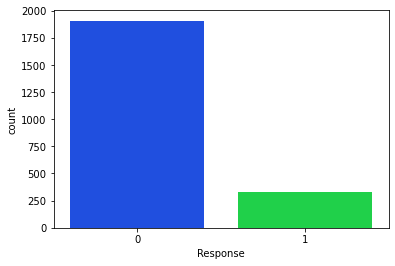

In [6]:
print(data['Response'].value_counts())

sns.countplot(data['Response']);

0    2219
1      21
Name: Complain, dtype: int64


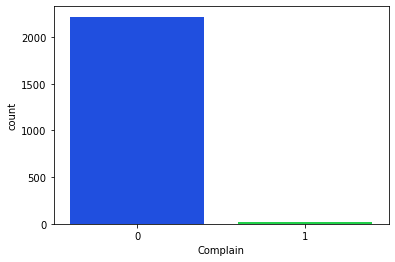

In [7]:
print(data['Complain'].value_counts())

sns.countplot(data['Complain']);

In [12]:
display(data.T)

,0,1,2,3,4,5,6,7,8,9,...,2230,2231,2232,2233,2234,2235,2236,2237,2238,2239
ID,5524,2174,4141,6182,5324,7446,965,6177,4855,5899,...,7004,9817,8080,9432,8372,10870,4001,7270,8235,9405
Year_Birth,1957,1954,1965,1984,1981,1967,1971,1985,1974,1950,...,1984,1970,1986,1977,1974,1967,1946,1981,1956,1954
Education,Graduation,Graduation,Graduation,Graduation,PhD,Master,Graduation,PhD,PhD,PhD,...,Graduation,Master,Graduation,Graduation,Graduation,Graduation,PhD,Graduation,Master,PhD
Marital_Status,Single,Single,Together,Together,Married,Together,Divorced,Married,Together,Together,...,Single,Single,Single,Together,Married,Married,Together,Divorced,Together,Married
Income,58138.0,46344.0,71613.0,26646.0,58293.0,62513.0,55635.0,33454.0,30351.0,5648.0,...,11012.0,44802.0,26816.0,666666.0,34421.0,61223.0,64014.0,56981.0,69245.0,52869.0
Kidhome,0,1,0,1,1,0,0,1,1,1,...,1,0,0,1,1,0,2,0,0,1
Teenhome,0,1,0,0,0,1,1,0,0,1,...,0,0,0,0,0,1,1,0,1,1
Dt_Customer,04-09-2012,08-03-2014,21-08-2013,10-02-2014,19-01-2014,09-09-2013,13-11-2012,08-05-2013,06-06-2013,13-03-2014,...,16-03-2013,21-08-2012,17-08-2012,02-06-2013,01-07-2013,13-06-2013,10-06-2014,25-01-2014,24-01-2014,15-10-2012
Recency,58,38,26,26,94,16,34,32,19,68,...,82,71,50,23,81,46,56,91,8,40
MntWines,635,11,426,11,173,520,235,76,14,28,...,24,853,5,9,3,709,406,908,428,84


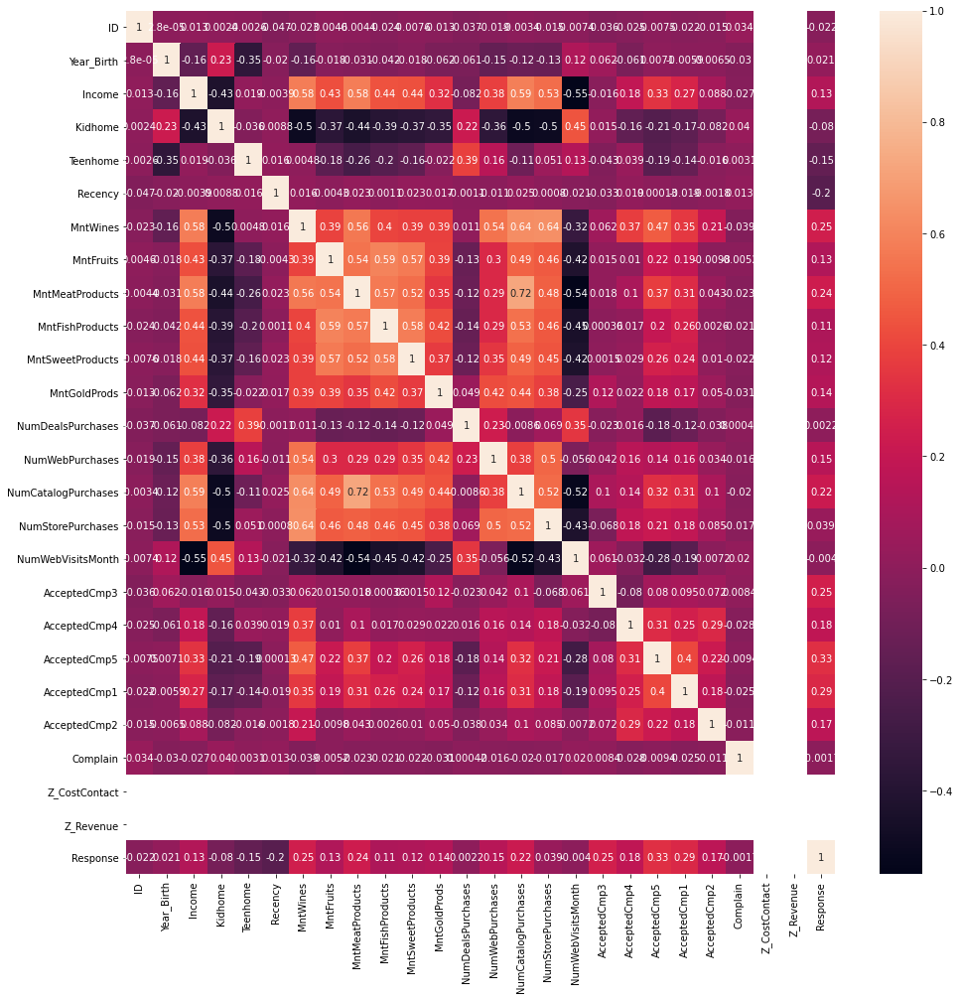

In [13]:
f, ax = plt.subplots(figsize=(16, 16))
sns.heatmap(data.corr(), annot=True, ax= ax, annot_kws={'size': 10})

plt.show()

In [6]:
data.duplicated().sum()

0

In [15]:
# !pip install pandas-profiling

import pandas_profiling

data.profile_report()

In [5]:
del data['ID']

In [6]:
del data['Z_CostContact'], data['Z_Revenue']

In [8]:
data.columns

Index(['Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response'],
      dtype='object')

# Outliers

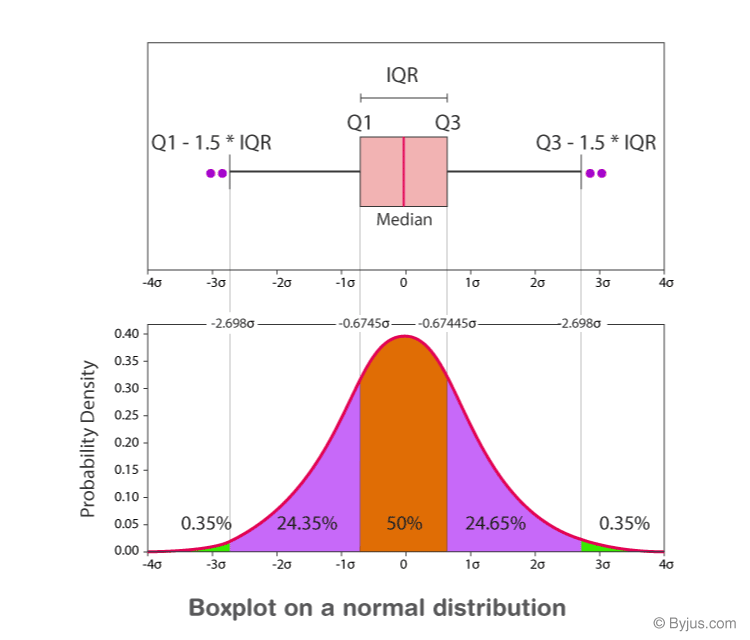

In [38]:
from IPython.display import Image

Image("Box-Plot.png")

In [34]:
data['Year_Birth'].unique()

array([1957, 1954, 1965, 1984, 1981, 1967, 1971, 1985, 1974, 1950, 1983,
       1976, 1959, 1952, 1987, 1946, 1980, 1949, 1982, 1979, 1951, 1969,
       1986, 1989, 1963, 1970, 1973, 1943, 1975, 1996, 1968, 1964, 1977,
       1978, 1955, 1966, 1988, 1948, 1958, 1972, 1960, 1945, 1991, 1962,
       1953, 1961, 1956, 1992, 1900, 1893, 1990, 1947, 1899, 1993, 1994,
       1941, 1944, 1995, 1940], dtype=int64)

In [8]:
conti_col = []
for col in data.columns:
    if data[col].dtype in ["int64","float64"]:
        conti_col.append(col)
#         print(col)

conti_col

['Year_Birth',
 'Income',
 'Kidhome',
 'Teenhome',
 'Recency',
 'MntWines',
 'MntFruits',
 'MntMeatProducts',
 'MntFishProducts',
 'MntSweetProducts',
 'MntGoldProds',
 'NumDealsPurchases',
 'NumWebPurchases',
 'NumCatalogPurchases',
 'NumStorePurchases',
 'NumWebVisitsMonth',
 'AcceptedCmp3',
 'AcceptedCmp4',
 'AcceptedCmp5',
 'AcceptedCmp1',
 'AcceptedCmp2',
 'Complain',
 'Response']

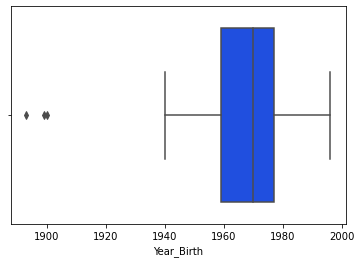

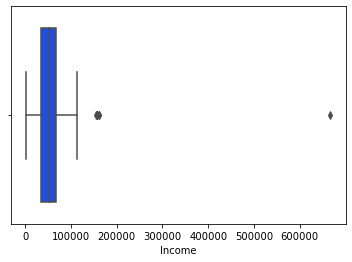

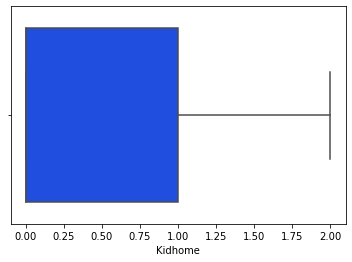

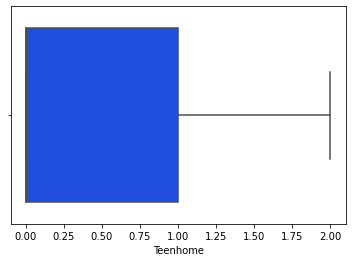

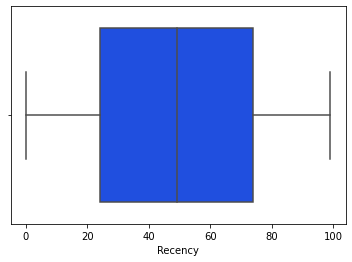

...

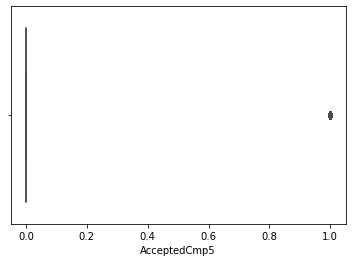

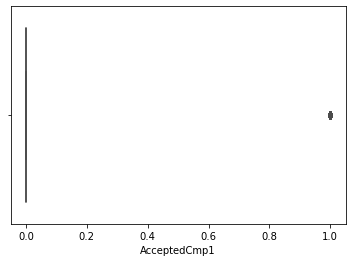

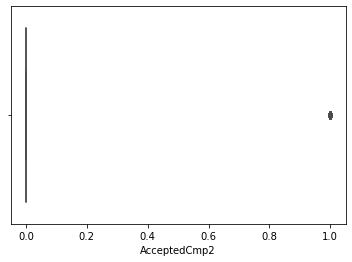

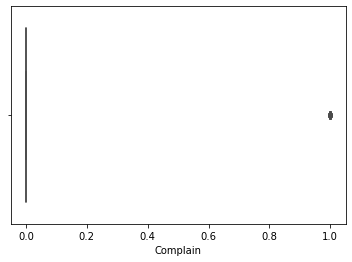

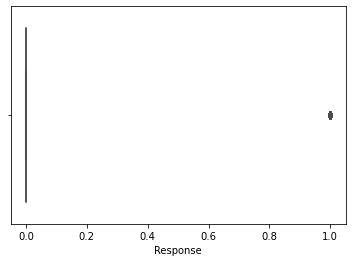

In [10]:
#outliers in numeric data

import matplotlib.pyplot as plt

for column in conti_col:
    plt.figure()
    sns.boxplot(data[column])


In [9]:
#seperating binay columns for removing outliers 

unwanted_lst = ['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Response']
conti_col = [e for e in conti_col if e not in unwanted_lst]
conti_col

['Year_Birth',
 'Income',
 'Kidhome',
 'Teenhome',
 'Recency',
 'MntWines',
 'MntFruits',
 'MntMeatProducts',
 'MntFishProducts',
 'MntSweetProducts',
 'MntGoldProds',
 'NumDealsPurchases',
 'NumWebPurchases',
 'NumCatalogPurchases',
 'NumStorePurchases',
 'NumWebVisitsMonth']

In [13]:
#remoing outliers

for i in data.loc[:,conti_col]:
    Q1 = data[i].quantile(0.25)
    Q3 = data[i].quantile(0.75)
    IQR = Q3 - Q1
    up_lim = Q3 + 1.5 * IQR
#     print(up_lim)
    low_lim = Q1 - 1.5 * IQR
    data.loc[data[i] > up_lim,i] = up_lim
    data.loc[data[i] < low_lim,i] = low_lim

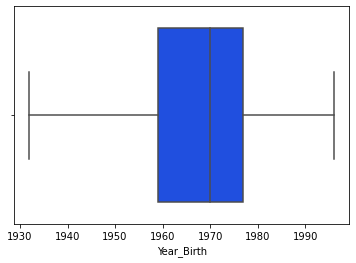

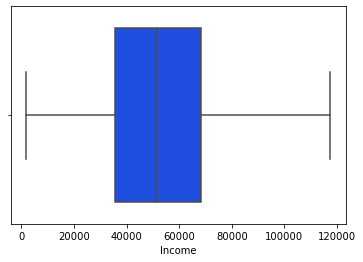

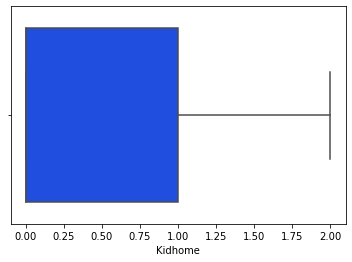

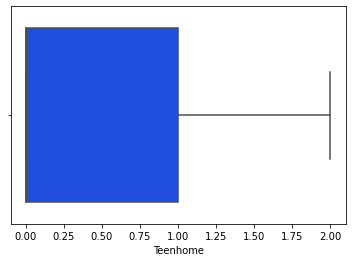

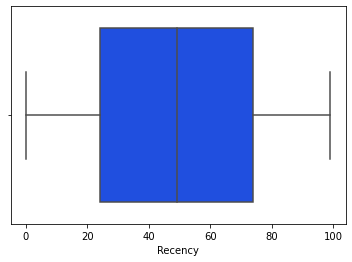

...

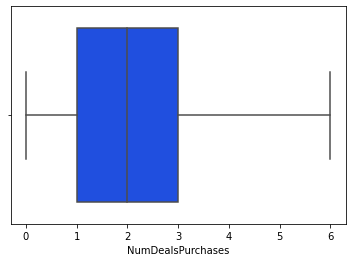

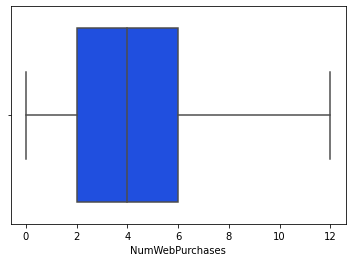

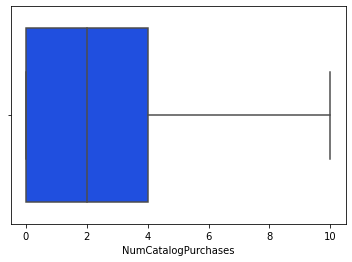

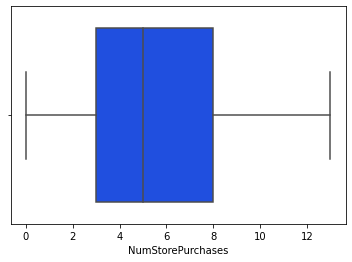

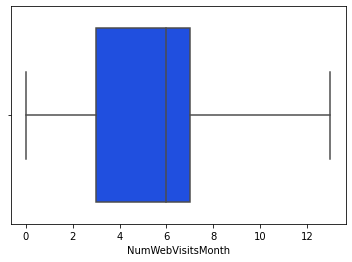

In [15]:


for column in conti_col:
    plt.figure()
    sns.boxplot(data[column])

In [12]:
# data['Year_Birth'] =  np.where(data["Year_Birth"] <1930, data['Year_Birth'].median() , data['Year_Birth'])

In [40]:
# https://www.kaggle.com/code/shavilyarajput/company-s-ideal-customers-marketing-strategy
# https://www.kaggle.com/code/hainescity/company-s-ideal-customers

# Conveting categorical features to Numeric

In [16]:
for col in data.columns:
    if data[col].dtypes == 'object':
        print(col)

Education
Marital_Status
Dt_Customer


Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: Education, dtype: int64


<AxesSubplot:xlabel='Education', ylabel='count'>

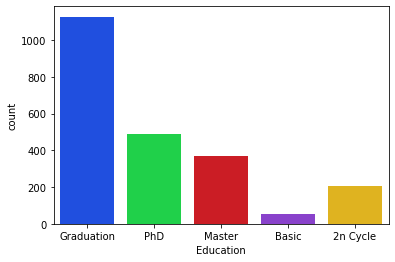

In [22]:
print(data['Education'].value_counts())
sns.countplot(data['Education'])

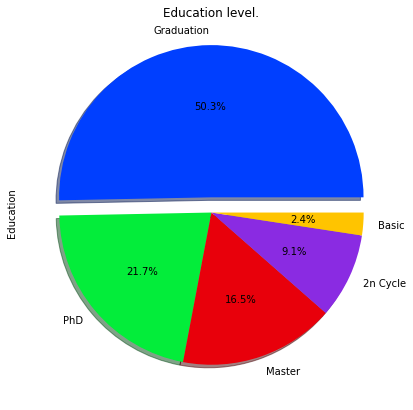

In [22]:
data['Education'].value_counts().plot(kind = 'pie' , autopct = '%1.1f%%' , shadow = True , explode = [0.1,0,0,0,0])
plt.title('Education level.')
fig = plt.gcf()
fig.set_size_inches(7,7)
plt.show()

Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: Marital_Status, dtype: int64


<AxesSubplot:xlabel='Marital_Status', ylabel='count'>

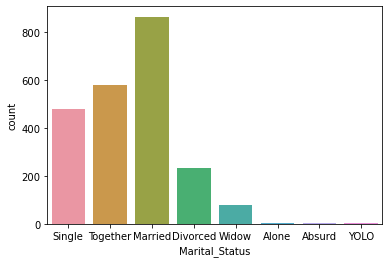

In [22]:
print(data['Marital_Status'].value_counts())
sns.countplot(data['Marital_Status'])

In [17]:
data['Dt_Customer'] = pd.to_datetime(data['Dt_Customer'])

In [18]:
from sklearn.preprocessing import OrdinalEncoder

enc = OrdinalEncoder()
#Education, Marital_Status

data['Education'] = enc.fit_transform(data[['Education']])
data['Marital_Status'] = enc.fit_transform(data[['Marital_Status']])

In [19]:
data.dtypes

Year_Birth                      int64
Education                     float64
Marital_Status                float64
Income                        float64
Kidhome                       float64
Teenhome                      float64
Dt_Customer            datetime64[ns]
Recency                         int64
MntWines                        int64
MntFruits                       int64
MntMeatProducts                 int64
MntFishProducts               float64
MntSweetProducts                int64
MntGoldProds                  float64
NumDealsPurchases               int64
NumWebPurchases                 int64
NumCatalogPurchases             int64
NumStorePurchases             float64
NumWebVisitsMonth               int64
AcceptedCmp3                    int64
AcceptedCmp4                    int64
AcceptedCmp5                    int64
AcceptedCmp1                    int64
AcceptedCmp2                    int64
Complain                        int64
Response                        int64
dtype: objec

In [20]:
data.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,1957,2.0,4.0,58138.0,0.0,0.0,2012-04-09,58,635,81,...,10,4.0,7,0,0,0,0,0,0,1
1,1954,2.0,4.0,46344.0,1.0,1.0,2014-08-03,38,11,1,...,1,2.0,5,0,0,0,0,0,0,0
2,1965,2.0,5.0,71613.0,0.0,0.0,2013-08-21,26,426,49,...,2,10.0,4,0,0,0,0,0,0,0
3,1984,2.0,5.0,26646.0,1.0,0.0,2014-10-02,26,11,4,...,0,4.0,6,0,0,0,0,0,0,0
4,1981,4.0,3.0,58293.0,1.0,0.0,2014-01-19,94,173,43,...,3,6.0,5,0,0,0,0,0,0,0


1) What is the average income of customers?

In [21]:
print('Average Income of costomer: ',data['Income'].mean())

Average Income of costomer:  51875.150460933466


In [67]:
#segregating featues and labels

x = data.drop(['Response', 'Dt_Customer'], axis =1)
y = data['Response']

<AxesSubplot:ylabel='Density'>

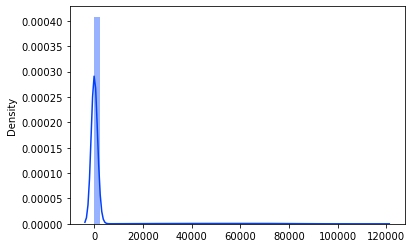

In [24]:
#distribution plot

sns.distplot(x)    #left skweed data

In [68]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()

X = sc.fit_transform(x)
X

array([[-1.00706384, -0.35014129,  0.25100375, ..., -0.26211122,
        -0.11651035, -0.09728167],
       [-1.2619687 , -0.35014129,  0.25100375, ..., -0.26211122,
        -0.11651035, -0.09728167],
       [-0.32731756, -0.35014129,  1.18033993, ..., -0.26211122,
        -0.11651035, -0.09728167],
       ...,
       [ 1.032175  , -0.35014129, -1.60766862, ..., -0.26211122,
        -0.11651035, -0.09728167],
       [-1.09203213,  0.53910643,  1.18033993, ..., -0.26211122,
        -0.11651035, -0.09728167],
       [-1.2619687 ,  1.42835415, -0.67833244, ..., -0.26211122,
        -0.11651035, -0.09728167]])

<AxesSubplot:ylabel='Density'>

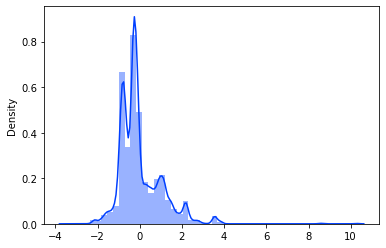

In [26]:
sns.distplot(X)

In [69]:
#spliting data into train and test split

from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(X,y, test_size=0.20, random_state=42)

In [34]:
print(len(y))

2240


In [41]:
print("label unique values percentage\n\n", (y.value_counts()/len(y)) * 100)


label unique values percentage

 0    85.089286
1    14.910714
Name: Response, dtype: float64


In [ ]:
#data is imbalanced 

# Classification models

1) Logistic regression

In [45]:
from sklearn.linear_model import LogisticRegression

#https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html
model1 = LogisticRegression(random_state=0, class_weight= 'balanced')

model1.fit(x_train, y_train)

LogisticRegression(class_weight='balanced', random_state=0)

In [46]:
model1.score(x_test, y_test)

0.7946428571428571

In [47]:
from sklearn.metrics import classification_report

y_pred = model1.predict(x_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.93      0.82      0.87       379
           1       0.40      0.68      0.51        69

    accuracy                           0.79       448
   macro avg       0.67      0.75      0.69       448
weighted avg       0.85      0.79      0.81       448



2) Support Vector Machine

In [57]:
from sklearn.svm import SVC

#https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html#sklearn.svm.SVC

model2 = SVC(class_weight='balanced')

model2.fit(x_train, y_train)

SVC(class_weight='balanced')

In [58]:
pred = model2.predict(x_test)

In [59]:
print(classification_report(y_test, pred))

              precision    recall  f1-score   support

           0       0.94      0.82      0.88       379
           1       0.42      0.71      0.53        69

    accuracy                           0.80       448
   macro avg       0.68      0.77      0.70       448
weighted avg       0.86      0.80      0.82       448



Smote for imabalanced data

In [61]:
from imblearn.over_sampling import SMOTE

sm = SMOTE()

X, y = sm.fit_resample(X, y)

In [63]:
from collections import Counter

Counter(y)

Counter({1: 1906, 0: 1906})

In [64]:
x_train, x_test, y_train, y_test = train_test_split(X,y, test_size=0.20, random_state=42)

In [65]:
model2.fit(x_train, y_train)

SVC(class_weight='balanced')

In [66]:
y_p = model2.predict(x_test)

print(classification_report(y_test, y_p))

              precision    recall  f1-score   support

           0       0.91      0.82      0.86       382
           1       0.84      0.91      0.87       381

    accuracy                           0.87       763
   macro avg       0.87      0.87      0.87       763
weighted avg       0.87      0.87      0.87       763



Catboost model without SMOTE

In [70]:
y.value_counts()

0    1906
1     334
Name: Response, dtype: int64

In [76]:
# X.shape[1]
# cat_features = list(range(0, X.shape[1]))
# print(cat_features)


In [75]:
from catboost import CatBoostClassifier

clf = CatBoostClassifier(
    iterations=5, 
    learning_rate=0.1, 
    #loss_function='CrossEntropy'
)


clf.fit(x_train, y_train, 
#         cat_features=cat_features, 
        eval_set=(x_test, y_test), 
        verbose=False
)

print('CatBoost model is fitted: ' + str(clf.is_fitted()))
print('CatBoost model parameters:')
print(clf.get_params())

CatBoost model is fitted: True
CatBoost model parameters:
{'iterations': 5, 'learning_rate': 0.1}


In [77]:
clf = CatBoostClassifier(
    iterations=10,
#     verbose=5,
)

clf.fit(x_train, y_train, 
#         cat_features=cat_features, 
        eval_set=(x_test, y_test), 
        verbose=False
)

# Clusteing

# K-Means clustering
K-means is a centroid-based clustering algorithm, where we calculate the distance between each data point and a centroid to assign it to a cluster. The goal is to identify the K number of groups in the dataset. 

How does K-means work?

1) Choosing the number of clusters 
2) Initializing centroids
3) Assign data points to the nearest cluster
4) Re-initialize centroids 
5) We will keep repeating steps 3 and 4 until we have optimal centroids and the assignments of data points to correct   clusters are not changing anymore.

How to choose K?

“The elbow method is a heuristic used in determining the number of clusters in a data set. The method consists of plotting the explained variation as a function of the number of clusters, and picking the elbow of the curve as the number of clusters to use.

In [110]:
from sklearn.cluster import KMeans

#https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html#:~:text=K%2DMeans%20clustering.,%3D'k%2Dmeans%2B%2B'
kmeans_model = KMeans(init='k-means++', 
                      max_iter=500, 
                      random_state=42)

In [111]:
#issue: AttributeError: 'NoneType' object has no attribute 'split'
# !pip install threadpoolctl==3.1.0

Hyperparameter Tuning

In [112]:
cl_data = data.drop("Dt_Customer", axis = 1)

In [113]:
# 'AcceptedCmp3',
#  'AcceptedCmp4',
#  'AcceptedCmp5',
#  'AcceptedCmp1',
#  'AcceptedCmp2',
#  'Complain',
#  'Response'
# cl_data.columns

In [114]:
del cl_data['AcceptedCmp3'], cl_data['AcceptedCmp4'], cl_data['AcceptedCmp5'], cl_data['AcceptedCmp1'], cl_data['AcceptedCmp2']

In [115]:
del cl_data['Complain'], cl_data['Response']

In [116]:

#   inputs: K as integer and dataframe
#   apply k-means clustering to dataframe
#   and make a list of inertia values against 1 to K
#   return the inertia values list

def make_list_of_K(K, dataframe):
    cluster_values = list(range(2, K+1))
    inertia_values=[]
    
    for c in cluster_values:
        model = KMeans(
            n_clusters = c, 
            init='k-means++', 
            max_iter=500, 
            random_state=42)
        print(model)
#         display(dataframe)
        model.fit(dataframe)
        inertia_values.append(model.inertia_)
    
    return inertia_values

In [117]:
results = make_list_of_K(15, cl_data.iloc[:,3:])
print(results)
# k_values_distances = pd.DataFrame({"clusters": clusters,
#                                    "within cluster sum of squared distances": results})

KMeans(max_iter=500, n_clusters=2, random_state=42)
KMeans(max_iter=500, n_clusters=3, random_state=42)
KMeans(max_iter=500, n_clusters=4, random_state=42)
KMeans(max_iter=500, n_clusters=5, random_state=42)
KMeans(max_iter=500, n_clusters=6, random_state=42)
KMeans(max_iter=500, n_clusters=7, random_state=42)
KMeans(max_iter=500, random_state=42)
KMeans(max_iter=500, n_clusters=9, random_state=42)
KMeans(max_iter=500, n_clusters=10, random_state=42)
KMeans(max_iter=500, n_clusters=11, random_state=42)
KMeans(max_iter=500, n_clusters=12, random_state=42)
KMeans(max_iter=500, n_clusters=13, random_state=42)
KMeans(max_iter=500, n_clusters=14, random_state=42)
KMeans(max_iter=500, n_clusters=15, random_state=42)
[290457717062.12036, 150117724627.9013, 93952886600.47691, 63120901189.98677, 48704564880.11667, 36454687284.64403, 29071192392.855003, 22928893070.61428, 18276985894.443184, 14979999457.892206, 12331246978.1848, 10517790259.273537, 8790930730.384396, 7606380925.3435955]


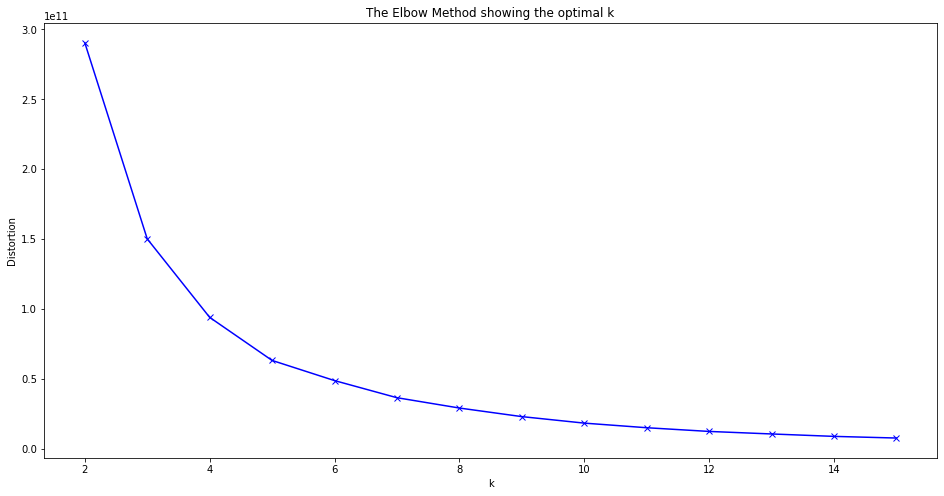

In [118]:
k = range(2,16)

plt.figure(figsize=(16,8))
plt.plot(k, results, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [119]:
# create clustering model with optimal k=6
updated_kmeans_model = KMeans(n_clusters = 7, 
                              init='k-means++', 
                              max_iter=500, 
                              random_state=42)
label = updated_kmeans_model.fit_predict(cl_data.iloc[:,3:])

In [88]:

label

array([2, 5, 3, ..., 2, 3, 2])

In [89]:
filtered_label0 = cl_data[label == 0]
filtered_label1 = cl_data[label == 1]
filtered_label2 = cl_data[label == 2]
filtered_label3 = cl_data[label == 3]
filtered_label4 = cl_data[label == 4]
filtered_label5 = cl_data[label == 5]
filtered_label6 = cl_data[label == 6]

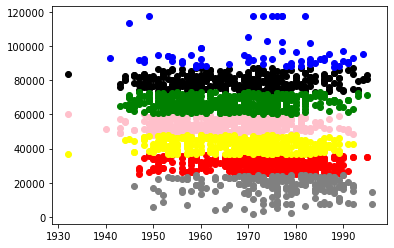

In [101]:
cols = filtered_label0.columns

plt.scatter(filtered_label0[cols[0]], filtered_label0[cols[3]], color = 'red')
plt.scatter(filtered_label1[cols[0]], filtered_label1[cols[3]], color = 'black')
plt.scatter(filtered_label2[cols[0]], filtered_label2[cols[3]], color = 'pink')
plt.scatter(filtered_label3[cols[0]], filtered_label3[cols[3]], color = 'green')
plt.scatter(filtered_label4[cols[0]], filtered_label4[cols[3]], color = 'blue')
plt.scatter(filtered_label5[cols[0]], filtered_label5[cols[3]], color = 'yellow')
plt.scatter(filtered_label6[cols[0]], filtered_label6[cols[3]], color = 'grey')
plt.show()

In [120]:
cl_data.columns

Index(['Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
       'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
       'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth'],
      dtype='object')

In [121]:
  cl_data['label'] = label

<AxesSubplot:xlabel='Income', ylabel='Year_Birth'>

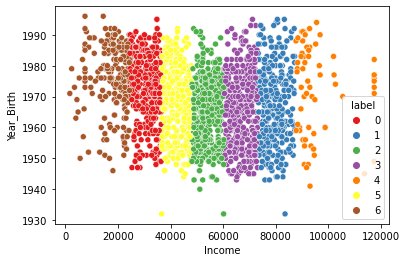

In [123]:
sns.scatterplot(cl_data['Income'], cl_data['Year_Birth'],
                hue=cl_data['label'],palette='Set1')